In [1]:
import matplotlib.pyplot as plt
import numpy as np
import corner
import astropy as ap
from astropy.io import fits
import astropy.io.fits as pyfits
from astropy.visualization import astropy_mpl_style
import pandas as pd
import math
import statistics
import scipy.ndimage as ndimage
import lenstronomy.Util.kernel_util as kernel_util
import lenstronomy.Plots.plot_util as plot_util
from lenstronomy.Util import util
from lenstronomy.PointSource.point_source import PointSource
from lenstronomy.Data.imaging_data import ImageData
from lenstronomy.Data.psf import PSF
from lenstronomy.Plots.model_plot import ModelPlot
from lenstronomy.Plots import chain_plot
from lenstronomy.Workflow.fitting_sequence import FittingSequence
from lenstronomy.Util import mask_util
from lenstronomy.ImSim.image_linear_solve import ImageLinearFit
from memory_profiler import memory_usage
plt.style.use(astropy_mpl_style)
%matplotlib inline


In [2]:
# general functions

def get_data(filename):
    """
    Input: filename
    Output: data table and image array
    """
    hdu_list = fits.open(filename)
    data = pd.DataFrame(hdu_list[2].data)  # get dataframe data
    image = hdu_list['IMAGE'].data  # get image data
    hdu_list.close()  # close
    return data, image


def plot_image(image_array):
    """
    Input: image array
    Output: plot of image
    """
    fig, ax = plt.subplots()
    ax.imshow(image_array, origin='lower')
    ax.set_xticks([])
    ax.set_xticks([])
    ax.grid(False)
    plt.show()
    plt.close()


In [3]:
# general functions for lensing

def approx_theta_E(center_x, center_y, x_images, y_images):
    """
    Input: Lens position (center_x, center_y) and image positions
    Output: estimated theta_E
    ** units must be in arcsec **
    """
    d = []

    for i in range(0, len(x_images)):
        x = float(x_images[i])
        y = float(y_images[i])
        x = center_x - x
        y = center_y - y
        dist = math.sqrt(x ** 2 + y ** 2)
        d.append(dist)

    theta_E = statistics.mean(d)
    print(f"'Estimated theta_E': {round(theta_E,2)}")
    return theta_E


def model_plot_all_bands(modelPlot):
    """
    Input: modelPlot = ModelPlot(multi_band_list, kwargs_model, kwargs_result,
                                 arrow_size=0.02, cmap_string="gist_heat")
    Output: 3x3 figure where each row is a band (G,R,I) and
            columns are observed, reconstructed, and normalized residuals
    """
    f, axes = plt.subplots(3, 3, figsize=(12, 12))  # 3x3 fig
    # set row names: names must be in same order as multi_band_list
    band_names = ['G', 'R', 'I']
    for index, band_name in enumerate(band_names):
        axes[index, 0].set_title(str(band_name)+'-Band')
        modelPlot.data_plot(ax=axes[index, 0], band_index=index)
        # image_names=False hides image points
        modelPlot.model_plot(ax=axes[index, 1],
                             image_names=True, band_index=index)
        modelPlot.normalized_residual_plot(ax=axes[index, 2],
                                           v_min=-6, v_max=6,
                                           band_index=index)
    plt.show()
    plt.close()


In [4]:
# psf function

def set_pixel_psf(coadd_id, band_index):
    """
    Input: coadd_id and band_index (g=0, r=1, i=2)
    Output: PIXEL psf model from fits file
    """
    # get data from fits file
    psf_filename = filepath + 'stars.fits'  # psf model from near field star
    psf_data, psf_image = get_data(psf_filename)

    # index by candidate's coadd_id
    psf_row = psf_data[psf_data['COADD_OBJECT_ID_CAND'] == coadd_id].index[0]  

    # crop kernel to odd number
    kernel = psf_image[psf_row, band_index, 0:45, 0:45]
    kernel_centered = kernel_util.center_kernel(kernel, iterations=20)
    kernel_nice = kernel_util.pixel_kernel(kernel_centered, subgrid_res=7)

    kernel_size = 13
    kernel_cut = kernel_util.cut_psf(kernel_centered, kernel_size)
    kwargs_psf = {'psf_type': 'PIXEL', 'pixel_size': deltaPix, 'kernel_point_source': kernel_cut}
    plot_image(kernel_cut)
    return kwargs_psf


In [5]:
# background_rms functions

def get_hist_stats(flat_image):
    """
    Input: 1d numpy array of image (flattened image)
           note: to flatten an image use '1d_array = 2d_array.flatten()'
    Output: number of bins for histogram based on spread of data,
            integer values of min and max (used for range of x-axis)
            root mean square value
    """
    min_int = math.floor(np.amin(flat_image))  # round min down to int
    max_int = math.ceil(np.amax(flat_image))  # round max up to int
    Bins = abs(min_int)+max_int  # num bins = one per integer value
    rms = np.sqrt(np.mean(flat_image**2))  # calculate rms
    return Bins, min_int, max_int, rms

def get_rms(filename, coadd_id, crop):
    """
    Long Version:
    Input: filename, coadd_id of image, and background region
           region = crop = [[x_lower, x_upper], [y_lower, y_upper]]
    Output: RGB image of region to check that selected region is good,
            histogram for each band, returns rms_list (g,r,i)
    """
    data, image = get_data(filename)
    row = data[data['COADD_OBJECT_ID'] == coadd_id].index[0]

    # crop g,r,i bands to region
    g_crop = image[row, 0, crop[0][0]:crop[0][1], crop[1][0]:crop[1][1]]
    r_crop = image[row, 1, crop[0][0]:crop[0][1], crop[1][0]:crop[1][1]]
    i_crop = image[row, 2, crop[0][0]:crop[0][1], crop[1][0]:crop[1][1]]

    rgb_crop = ap.visualization.make_lupton_rgb(i_crop, r_crop,
                                                g_crop, stretch=50, Q=10)
    plot_image(rgb_crop)  # check rgb image

    g_flat = g_crop.flatten()  # make 2d image array into 1d np array
    r_flat = r_crop.flatten()
    i_flat = i_crop.flatten()

    rms_list = []  # each rms value will be saved here and returned

    # set up figure and axes for plotting
    f, ax = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

    # settings for each band (flattened image, index, plot title and color)
    band_flats = [g_flat, r_flat, i_flat]  # combine flattened images into list
    band_index = range(len(band_flats))  # make list of band indices
    band_names = ['G-BAND', 'R-BAND', 'I-BAND']  # set band labels
    band_colors = ['lightblue', 'yellowgreen', 'tomato']  # set plot colors
    combined_lists = zip(band_flats, band_index, band_names, band_colors)

    # loop to set ax for each band
    for flat_image, index, name, color in combined_lists:
        Bins, min_int, max_int, rms = get_hist_stats(flat_image)  # get stats
        rms_list.append(rms)  # save rms

        # create ax for g,r,i bands
        ax[index].hist(flat_image, bins=Bins, range=(min_int, max_int),
                       color=color, label='RMS = '+str(round(rms, 3)))
        ax[index].set_title(name)  # show title
        ax[index].set_xlim(xmin=min_int, xmax=max_int)
        ax[index].legend()  # show rms in legend rounded to 3 decimals

    plt.tight_layout()
    plt.show()
    plt.close()
    return rms_list


def get_rms_fast(filename, coadd_id, crop):
    """
    Short Version:
    Input: filename, coadd_id of image, and background region
           region = crop = [[x_lower, x_upper], [y_lower, y_upper]]
    Output: rms_list (g,r,i)
    """
    data, image = get_data(filename)
    row = data[data['COADD_OBJECT_ID'] == coadd_id].index[0]

    # crop g,r,i bands to region
    g_crop = image[row, 0, crop[0][0]:crop[0][1], crop[1][0]:crop[1][1]]
    r_crop = image[row, 1, crop[0][0]:crop[0][1], crop[1][0]:crop[1][1]]
    i_crop = image[row, 2, crop[0][0]:crop[0][1], crop[1][0]:crop[1][1]]

    # list of flattened images (1d image arrays)
    band_flats = [g_crop.flatten(), r_crop.flatten(), i_crop.flatten()]
    rms_list = []  # rms values will be saved here and returned

    # loop to get rms for each band
    for index, flat_image in enumerate(band_flats):
        _, _, _, rms = get_hist_stats(flat_image)  # get rms
        rms_list.append(rms)  # save rms

    return rms_list


In [6]:
# set filenames
filepath = '/Users/gilliancartwright/Desktop/DES data/'  # personal file path
filename = filepath + 'Rob_candidates.fits'  # pre-cropped images
psf_filename = filepath + 'stars.fits'  # near field bright star psf
rms_filename = filepath + 'Rob_candidates_larger.fits'  # more background

# show data table for reference
data, image = get_data(filename)
data.head(3)


,COADD_OBJECT_ID,TILENAME,HPIX_16384,HPIX_4096,DNF_ZMEAN_SOF,RA,DEC,FLUX_RADIUS_G,FLUX_RADIUS_R,FLUX_RADIUS_I,...,FWHM_WMEAN_G,FWHM_WMEAN_R,FWHM_WMEAN_I,FWHM_WMEAN_Z,SKYBRITE_WMEAN_G,SKYBRITE_WMEAN_R,SKYBRITE_WMEAN_I,SKYBRITE_WMEAN_Z,NAME,NAME_FOLDER
0,1400263522,DES0336-2915,2354916223,147182263,0.938449,53.898900,-28.912203,3.962615,4.879757,4.983489,...,1.09654,0.943639,0.817035,0.899360,390.652008,947.728027,3299.189941,7099.970215,DES-691022126,DES0336-2915
1,1325853948,DES0242-0041,1163420627,72713789,0.006323,40.969310,-0.619002,10.245866,10.665524,11.179090,...,1.09442,0.956736,0.894366,0.889644,459.313995,1283.849976,3451.110107,8414.360352,DES-701263907,DES0242-0041
2,1087262176,DES0038-4414,2318857161,144928572,0.545765,10.155908,-44.437518,5.865641,5.180269,5.163048,...,1.28928,1.035290,1.025070,0.777657,406.477997,1063.030029,2966.409912,8586.750000,DES-699919273,DES0038-4414


In [7]:
# DES camera specifics
exp_time = 90.  # exposure time
numPix = 46  # number of pixels in image
deltaPix = 0.2637  # pixel size in arcsec


In [8]:
# MODEL
def model(coadd_id, kwargs_lens_initial, kwargs_light_initial,
          x_images, y_images, psf_type, rms_list):
    """
    INPUT: coadd_id, initial lens mass and light model params,
           and positions in arcsec of images
    OUTPUT: RGB image,
            observed image, modeled image, residuals plot, (each band)
            and results of PSO and MCMC fitting
    """
    # Image data
    data, image = get_data(filename)
    # index data frame by coadd_id
    row = data[data['COADD_OBJECT_ID'] == coadd_id].index[0]

    g = image[row, 0, :, :] # get image array
    r = image[row, 1, :, :]
    i = image[row, 2, :, :]

    fwhm_g = data.iloc[row, 27] # get fwhm
    fwhm_r = data.iloc[row, 28]
    fwhm_i = data.iloc[row, 29]

    rms_g = rms_list[0]  # get background_rms
    rms_r = rms_list[1]
    rms_i = rms_list[2]

    # set models to use
    # input for point source is image positions, not source position
    lens_model_list = ['SIE']
    lens_light_model_list = ['SERSIC_ELLIPSE']
    point_source_list = ['LENSED_POSITION']

    # generate coordinate grid and image properties
    _, _, ra_at_xy_0, dec_at_xy_0, _, _, Mpix2coord, _ = util.make_grid_with_coordtransform(numPix, deltaPix, subgrid_res=1, center_ra=0, center_dec=0, inverse=False)

    # generate image data for each band
    kwargs_data_g = {'background_rms': rms_g,  # calculated from background section
                     'exposure_time': exp_time,  # from DES camera
                     'ra_at_xy_0': ra_at_xy_0,
                     'dec_at_xy_0': dec_at_xy_0,
                     'transform_pix2angle': Mpix2coord,  # coords in ra, dec
                     'image_data': g}  # 2d image array

    kwargs_data_r = {'background_rms': rms_r,
                     'exposure_time': exp_time,
                     'ra_at_xy_0': ra_at_xy_0,
                     'dec_at_xy_0': dec_at_xy_0,
                     'transform_pix2angle': Mpix2coord,
                     'image_data': r}

    kwargs_data_i = {'background_rms': rms_i,
                     'exposure_time': exp_time,
                     'ra_at_xy_0': ra_at_xy_0,
                     'dec_at_xy_0': dec_at_xy_0,
                     'transform_pix2angle': Mpix2coord,
                     'image_data': i}

    # set kwargs_psf depending on psf_type
    if psf_type == 'GAUSSIAN':
        kwargs_psf_g = {'psf_type': 'GAUSSIAN', 'fwhm': fwhm_g,
                        'pixel_size': deltaPix, 'truncation': 4}
        kwargs_psf_r = {'psf_type': 'GAUSSIAN', 'fwhm': fwhm_r,
                        'pixel_size': deltaPix, 'truncation': 4}
        kwargs_psf_i = {'psf_type': 'GAUSSIAN', 'fwhm': fwhm_i,
                        'pixel_size': deltaPix, 'truncation': 4}

    # psf from near field bright star
    elif psf_type == 'PIXEL':
        kwargs_psf_g = set_pixel_psf(coadd_id, 0)
        kwargs_psf_r = set_pixel_psf(coadd_id, 1)
        kwargs_psf_i = set_pixel_psf(coadd_id, 2)

    else:
        print("Invalid psf_type. Choose 'GAUSSIAN' or 'PIXEL'.")

    # Settings for model
    kwargs_numerics = {'supersampling_factor': 1,
                       'supersampling_convolution': False}

    # combine models
    kwargs_model = {'lens_model_list': lens_model_list,
                    'lens_light_model_list': lens_light_model_list,
                    'point_source_model_list': point_source_list,
                    'additional_images_list': [False],
                    'fixed_magnification_list': [False]}  # not modeling flux ratios here

    num_images = len(x_images)  # number of images
    kwargs_constraints = {'num_point_source_list': [num_images]}
    # see lenstronomy_extensions: quad modeling for more info on likelihood
    kwargs_likelihood = {'check_bounds': True,
                         'force_no_add_image': False,
                         'source_marg': False,
                         'image_position_uncertainty': 0.004,
                         'check_matched_source_position': True,
                         'source_position_tolerance': 0.001,
                         'source_position_sigma': 0.001}  


    # Combine bands for modeling
    g_band = [kwargs_data_g, kwargs_psf_g, kwargs_numerics]
    r_band = [kwargs_data_r, kwargs_psf_r, kwargs_numerics]
    i_band = [kwargs_data_i, kwargs_psf_i, kwargs_numerics]
    multi_band_list = [g_band, r_band, i_band]
    kwargs_data_joint = {'multi_band_list': multi_band_list,
                         'multi_band_type': 'multi-linear'}

    # Add parameters to model:
    # lens
    kwargs_lens_fixed = [{}]  # fixed parameters
    kwargs_lens_init = [kwargs_lens_initial]  # initial input
    kwargs_lens_sigma = [{'theta_E': 0.2, 'e1': 0.1, 'e2': 0.1,
                          'center_x': 0.01, 'center_y': 0.01}]  # step sizes
    kwargs_lower_lens = [{'theta_E': theta_E - 0.7, 'e1': -0.5, 'e2': -0.5,
                          'center_x': center_x - 0.1, 'center_y': center_y-0.1}]  # lower bounds
    kwargs_upper_lens = [{'theta_E': theta_E + 0.7, 'e1': 0.5, 'e2': 0.5,
                          'center_x': center_x + 0.1, 'center_y': center_y+0.1}]  # upper bounds

    # lens light
    kwargs_lens_light_fixed = [{}]
    kwargs_lens_light_init = [kwargs_light_initial]
    kwargs_lens_light_sigma = [{'R_sersic': 0.1, 'n_sersic': 0.1,
                                'e1': 0.1, 'e2': 0.1,
                                'center_x': 0.01, 'center_y': 0.01}]
    kwargs_lower_lens_light = [{'R_sersic': 0.05, 'n_sersic': 0.5,
                                'e1': -0.5, 'e2': -0.5,
                                'center_x': center_x-0.1, 'center_y': center_y-0.1}]
    kwargs_upper_lens_light = [{'R_sersic': 10, 'n_sersic': 5.,
                                'e1': 0.5, 'e2': 0.5,
                                'center_x': center_x+0.1, 'center_y': center_y+0.1}]

    # point source image positions
    fixed_ps = [{}]
    kwargs_ps_init = [{'ra_image': x_images,'dec_image': y_images}]
    kwargs_ps_sigma = [{'ra_image': [0.01] * num_images,
                        'dec_image': [0.01] * num_images}]
    kwargs_lower_ps = [{'ra_image': [i-0.1 for i in x_images],
                        'dec_image': [i-0.1 for i in y_images]}]
    kwargs_upper_ps = [{'ra_image': [i+0.1 for i in x_images],
                        'dec_image': [i+0.1 for i in y_images]}]

    # combine params
    lens_params = [kwargs_lens_init,
                   kwargs_lens_sigma,
                   kwargs_lens_fixed,
                   kwargs_lower_lens,
                   kwargs_upper_lens]

    lens_light_params = [kwargs_lens_light_init,
                         kwargs_lens_light_sigma,
                         kwargs_lens_light_fixed,
                         kwargs_lower_lens_light,
                         kwargs_upper_lens_light]

    ps_params = [kwargs_ps_init,
                 kwargs_ps_sigma,
                 fixed_ps,
                 kwargs_lower_ps,
                 kwargs_upper_ps]

    kwargs_params = {'lens_model': lens_params,
                     'lens_light_model': lens_light_params,
                     'point_source_model': ps_params}

    # Fitting
    fitting_seq = FittingSequence(kwargs_data_joint,
                                  kwargs_model,
                                  kwargs_constraints,
                                  kwargs_likelihood,
                                  kwargs_params)

    fitting_kwargs_list = [['PSO', {'sigma_scale': 1.,
                                    'n_particles': 600,
                                    'n_iterations': 600}],
                           ['MCMC', {'n_burn': 200,
                                     'n_run': 600,
                                     'walkerRatio': 10,
                                     'sigma_scale': .1}]]

    chain_list = fitting_seq.fit_sequence(fitting_kwargs_list)
    kwargs_result = fitting_seq.best_fit()

    # Show final results
    modelPlot = ModelPlot(multi_band_list, kwargs_model, kwargs_result,
                          arrow_size=0.02, cmap_string="gist_heat")

    # plot RGB image
    rgb_image = ap.visualization.make_lupton_rgb(i, r, g, stretch=50, Q=10)
    plot_image(rgb_image)

    # plot observed, reconstructed, and residual plots for each band
    model_plot_all_bands(modelPlot)

    # Results of MCMC chain
    sampler_type, samples_mcmc, param_mcmc, dist_mcmc = chain_list[1]
    for i in range(len(chain_list)):
        chain_plot.plot_chain_list(chain_list, i)

    print("number of non-linear parameters in the MCMC process: ", len(param_mcmc))
    print("parameters in order: ", param_mcmc)
    print("number of evaluations in the MCMC process: ", np.shape(samples_mcmc)[0])
    n_sample = len(samples_mcmc)
    print(n_sample)
    samples_mcmc_cut = samples_mcmc[int(n_sample * 1/2.):]

    n, num_param = np.shape(samples_mcmc_cut)
    plot = corner.corner(samples_mcmc_cut[:, :], labels=param_mcmc[:], show_titles=True)

    # summary of input positions vs. results from model
    print('Measured Positions: ')
    print(f"center: ({center_x}, {center_y})")
    print(f'ra_images: {x_images} ')
    print(f'dec_images: {y_images}')
    print('===============================')
    print('Result Positions: ')
    print(f"center: ({round(kwargs_result.get('kwargs_lens')[0].get('center_x'), 2)}, {round(kwargs_result.get('kwargs_lens')[0].get('center_y'), 2)})")
    print(f"ra_images: {np.around(kwargs_result.get('kwargs_ps')[0].get('ra_image'), 2)}")
    print(f"dec_images: {np.around(kwargs_result.get('kwargs_ps')[0].get('dec_image'), 2)}")
    

In [9]:
psf_type = 'PIXEL'

'Estimated theta_E': 1.67


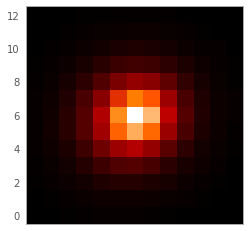

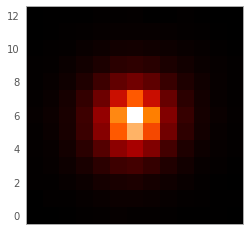

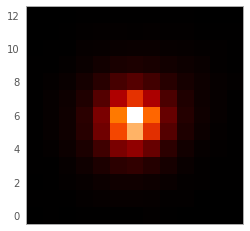

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
Max iteration reached! Stopping.
-4.1983404974283545 reduced X^2 of best position
-13264.656801624886 logL
6319.0 effective number of data points
[{'theta_E': 1.695751898751884, 'e1': 0.08589358515042149, 'e2': 0.20781024087750766, 'center_x': 0.350999944534788, 'center_y': 0.004000006984042811}] lens result
[] source result
[{'amp': 1, 'R_sersic': 1.1384731685201663, 'n_sersic': 1.4353895046785625, 'e1': -0.23290375980132863, 'e2': 0.19520951976965573, 'center_x': 0.15103396877419645, 'center_y': 0.09900985396954534}] lens light result
[{'ra_image': array([-0.71799986,  0.27400013,  1.97999973]), 'dec_image': array([-0.76300016,  1.80522343, -0.9830003 ]), 'point_amp': array([1., 1., 1.])}] point source result
{} special param result
98

100%|█████████████████████████████████████████| 800/800 [06:38<00:00,  2.01it/s]

Computing the MCMC...
Number of walkers =  170
Burn-in iterations:  200
Sampling iterations (in current run): 800
398.9531259536743 time taken for MCMC sampling
-1.261490973582885 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  1.2124123338716537
reduced chi^2 of data  1 =  1.2266921993954039
reduced chi^2 of data  2 =  1.3453683874815971


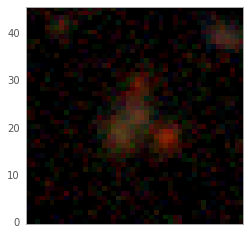

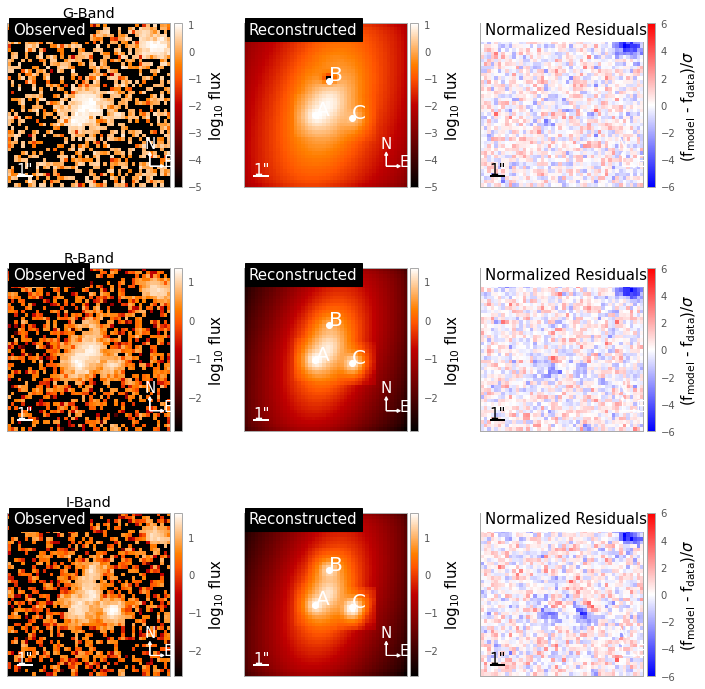

number of non-linear parameters in the MCMC process:  17
parameters in order:  ['theta_E_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'R_sersic_lens_light0', 'n_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'ra_image', 'ra_image', 'ra_image', 'dec_image', 'dec_image', 'dec_image']
number of evaluations in the MCMC process:  102000
102000
Measured Positions: 
center: (0.251, 0.104)
ra_images: [-0.618, 0.374, 1.88] 
dec_images: [-0.863, 1.795, -1.083]
Result Positions: 
center: (0.35, 0.0)
ra_images: [-0.72  0.27  1.98]
dec_images: [-0.76  1.81 -0.98]
Total Memory Usage: 728.98828125


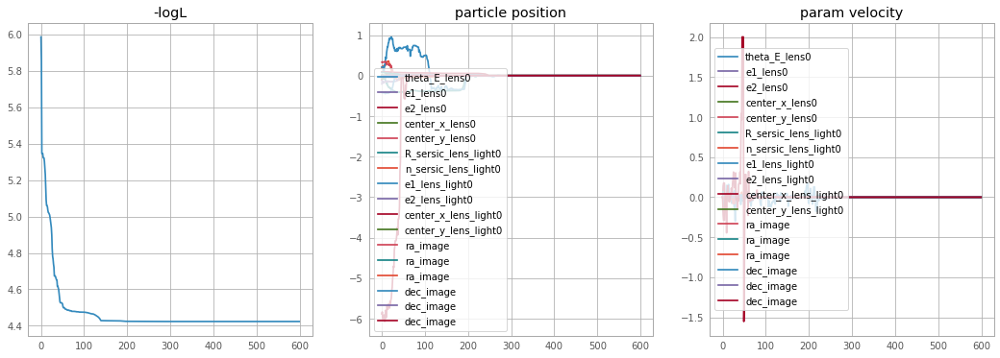

<Figure size 432x288 with 0 Axes>

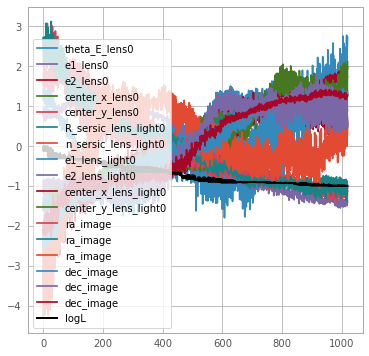

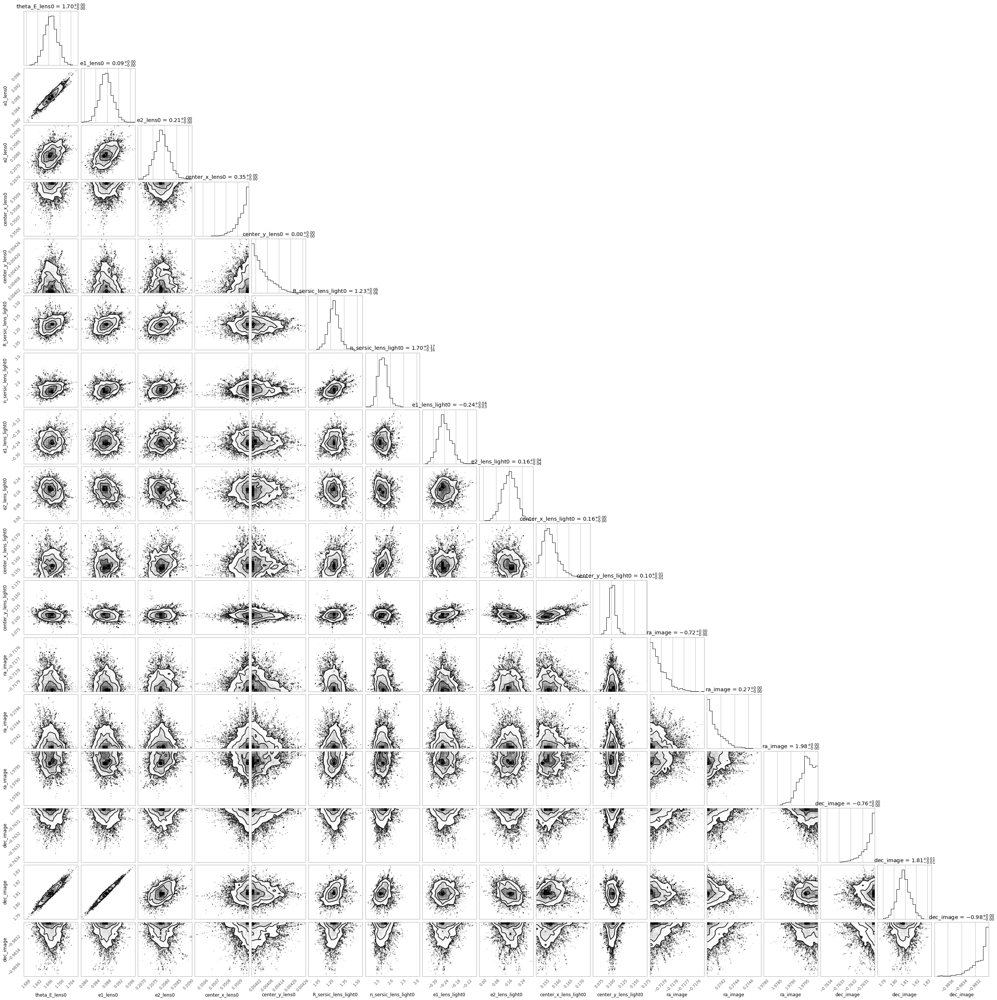

In [23]:
# DES_2915, coadd_id = 1400263522

# background_rms
crop = [[85, 114], [85, 114]]
rms_list = get_rms_fast(rms_filename, 1400263522, crop)

# image positions, measured
x_images = [-0.618, 0.374, 1.88]
y_images = [-0.863, 1.795, -1.083]

# lens position
center_x = 0.251
center_y = 0.104

# initial guesses for params
theta_E = approx_theta_E(center_x, center_y, x_images, y_images)
kwargs_lens_initial = {'theta_E': theta_E, 'e1': 0., 'e2': 0.,
                       'center_x': center_x, 'center_y': center_y}
kwargs_light_initial = {'R_sersic': 1, 'n_sersic': 2, 'e1': 0., 'e2': 0.,
                        'center_x': center_x, 'center_y': center_y}

# run model with memory tracker
mem_usage = memory_usage((model, (1400263522,
                                  kwargs_lens_initial,
                                  kwargs_light_initial,
                                  x_images, y_images,
                                  psf_type, rms_list), ))

print(f"Total Memory Usage: {mem_usage[-1]}")
print("================================================================")

### Summary: 
* PIXEL psf model
* lens mass and light position vary within +-0.1 arcsec
* image positions vary for image positions is +- 0.1 arcsec
* PSO did not converge
    * 600 particles, 600 iterations
    * time taken = 16.5 min
* MCMC: 
    * 200 burn, 600 run, 10 walkerRatio
    * time taken = 6.5 min
    * num of free params: 17
* total memory: 730
* total time: 23 min

'Estimated theta_E': 2.06


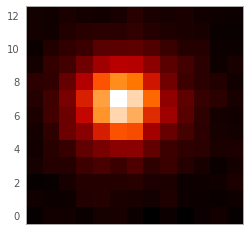

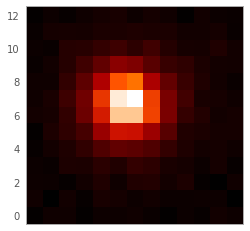

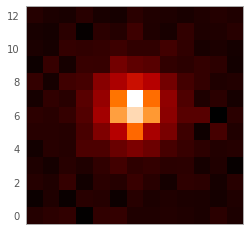

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
Max iteration reached! Stopping.
-11.701243754569553 reduced X^2 of best position
-36970.0796425625 logL
6319.0 effective number of data points
[{'theta_E': 2.1279250450725415, 'e1': -0.03686051687976754, 'e2': 0.035152677405894825, 'center_x': 1.5800002847828114, 'center_y': -1.2310000411531716}] lens result
[] source result
[{'amp': 1, 'R_sersic': 0.8740552420942513, 'n_sersic': 4.999975856971604, 'e1': 0.16835428804373517, 'e2': -0.20195601977117839, 'center_x': 1.5801131280079193, 'center_y': -1.4309992591925071}] lens light result
[{'ra_image': array([-2.58885437e-02, -9.99984186e-04,  3.72271177e+00]), 'dec_image': array([ 0.10100041, -2.54199998, -1.89646284]), 'point_amp': array([1., 1., 1.])}] point source result
{} special para

100%|█████████████████████████████████████████| 800/800 [06:17<00:00,  2.12it/s]

Computing the MCMC...
Number of walkers =  170
Burn-in iterations:  200
Sampling iterations (in current run): 800
378.7582380771637 time taken for MCMC sampling
-11.653430680076918 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  1.9917518236729086
reduced chi^2 of data  1 =  11.094359032207576
reduced chi^2 of data  2 =  21.87418118435026


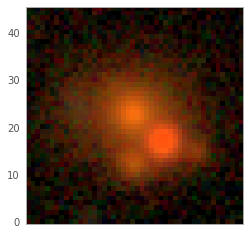

/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',


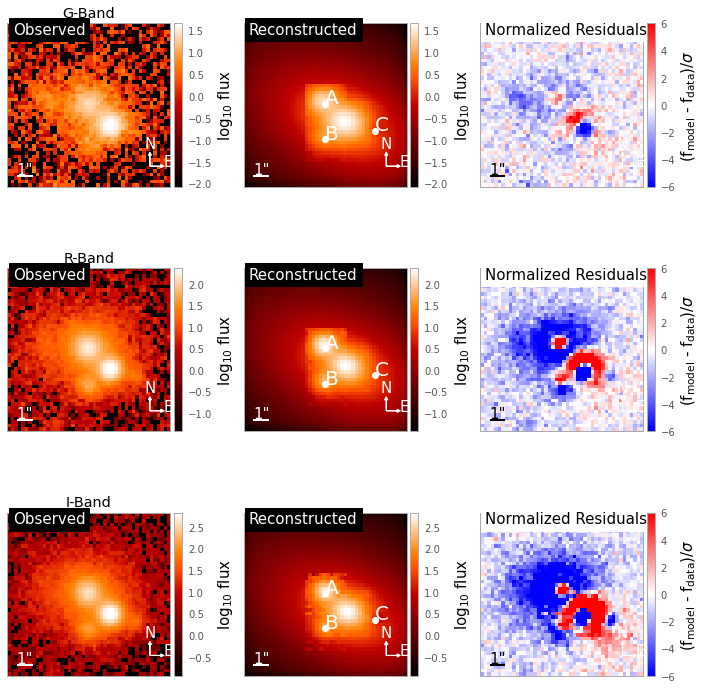

number of non-linear parameters in the MCMC process:  17
parameters in order:  ['theta_E_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'R_sersic_lens_light0', 'n_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'ra_image', 'ra_image', 'ra_image', 'dec_image', 'dec_image', 'dec_image']
number of evaluations in the MCMC process:  102000
102000


Measured Positions: 
center: (1.68, -1.331)
ra_images: [0.068, 0.099, 3.623] 
dec_images: [0.201, -2.442, -1.878]
Result Positions: 
center: (1.58, -1.23)
ra_images: [-0.03 -0.    3.72]
dec_images: [ 0.1  -2.54 -1.9 ]
Total Memory Usage: 703.5234375


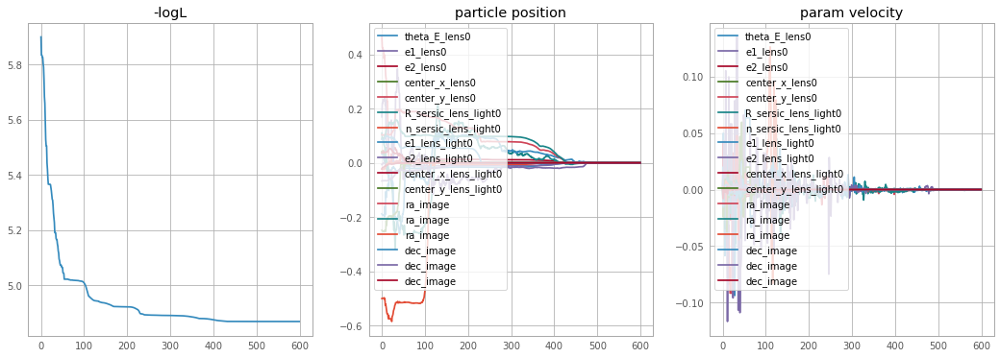

<Figure size 432x288 with 0 Axes>

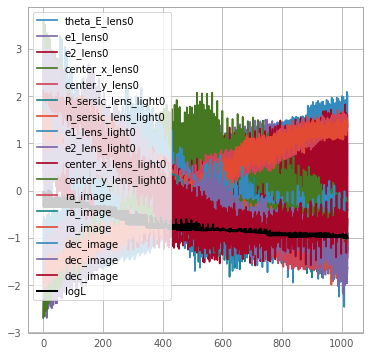

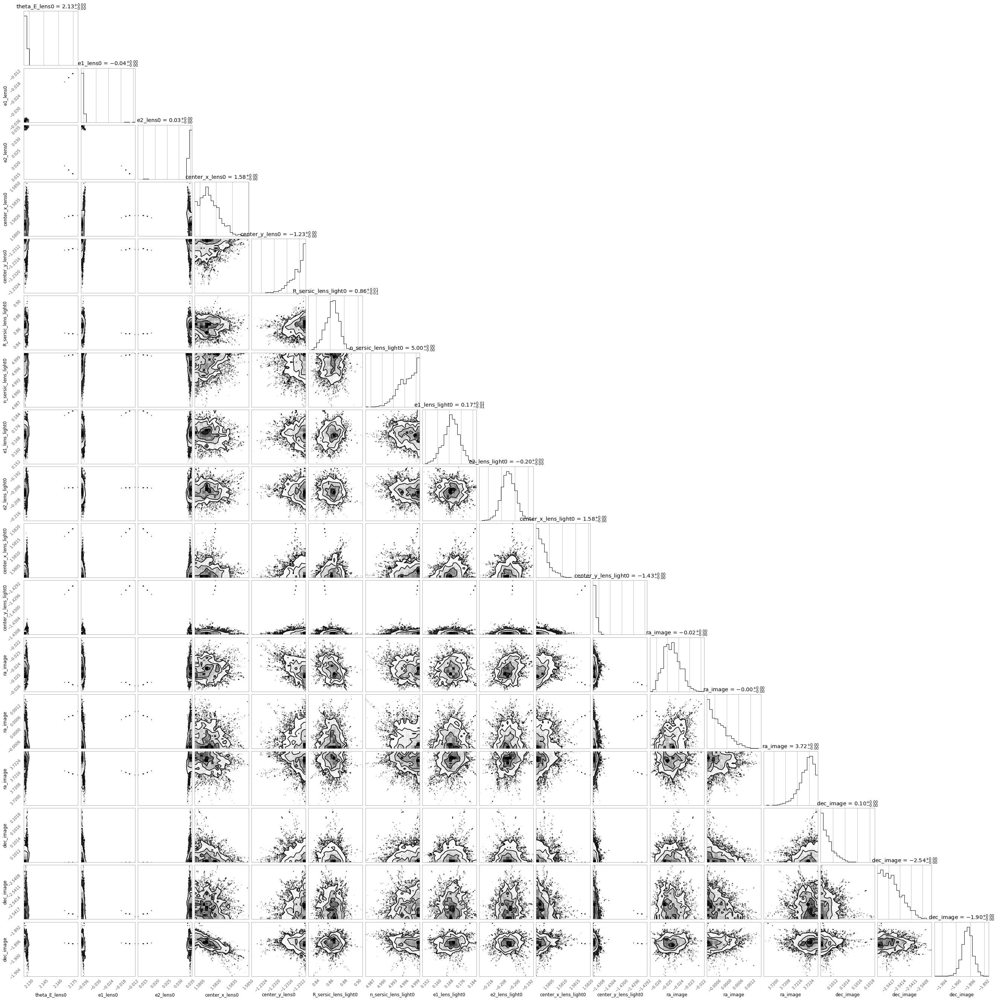

In [10]:
# DES_4414, coadd_id = 1087262176

# background_rms
crop = [[0, 35], [0, 35]]
rms_list = get_rms_fast(rms_filename, 1087262176, crop)

# lens position:
center_x = 1.68
center_y = -1.331

# image positions, measured
x_images = [0.068, 0.099, 3.623]
y_images = [0.201, -2.442, -1.878]

# initial guesses for params
theta_E = approx_theta_E(center_x, center_y, x_images, y_images)

kwargs_lens_initial = {'theta_E': theta_E, 'e1': 0., 'e2': 0,
                       'center_x': center_x, 'center_y': center_y}
kwargs_light_initial = {'R_sersic': 1, 'n_sersic': 2, 'e1': 0,
                        'e2': 0, 'center_x': center_x, 'center_y': center_y}

# run model with memory tracker
mem_usage = memory_usage((model, (1087262176,
                                  kwargs_lens_initial,
                                  kwargs_light_initial,
                                  x_images, y_images,
                                  psf_type, rms_list), ))

print(f"Total Memory Usage: {mem_usage[-1]}")
print("================================================================")


### Summary: 
* PIXEL psf model
* lens mass and light position vary within +-0.1 arcsec
* image positions vary for image positions is +- 0.1 arcsec
* PSO did not converge
    * 600 particles, 600 iterations
    * time taken = 12 min
* MCMC: 
    * 200 burn, 600 run, 10 walkerRatio
    * time taken = 6 min
    * num of free params: 17
* total memory: 700
* total time: 18 min

In [11]:
psf_type = 'GAUSSIAN'

'Estimated theta_E': 1.67
Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
Max iteration reached! Stopping.
-4.232240708548161 reduced X^2 of best position
-13371.764518657912 logL
6319.0 effective number of data points
[{'theta_E': 1.6903229493807705, 'e1': 0.08026128052378047, 'e2': 0.207329679889173, 'center_x': 0.35099960636321825, 'center_y': 0.004000014580406965}] lens result
[] source result
[{'amp': 1, 'R_sersic': 2.214101103969113, 'n_sersic': 2.810660271672696, 'e1': -0.1676315301870212, 'e2': 0.09459877073577506, 'center_x': 0.1510154851970936, 'center_y': 0.004040386369647487}] lens light result
[{'ra_image': array([-0.7179991 ,  0.27400005,  1.9799999 ]), 'dec_image': array([-0.76300001,  1.7904216 , -0.983     ]), 'point_amp': array([1., 1., 1.])}] point source result
{} 

100%|█████████████████████████████████████████| 800/800 [06:52<00:00,  1.94it/s]

Computing the MCMC...
Number of walkers =  170
Burn-in iterations:  200
Sampling iterations (in current run): 800
412.9903030395508 time taken for MCMC sampling
-1.2969107571604617 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  1.2222882802560489
reduced chi^2 of data  1 =  1.2782332026243406
reduced chi^2 of data  2 =  1.390210788600996


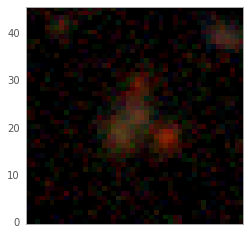

/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',


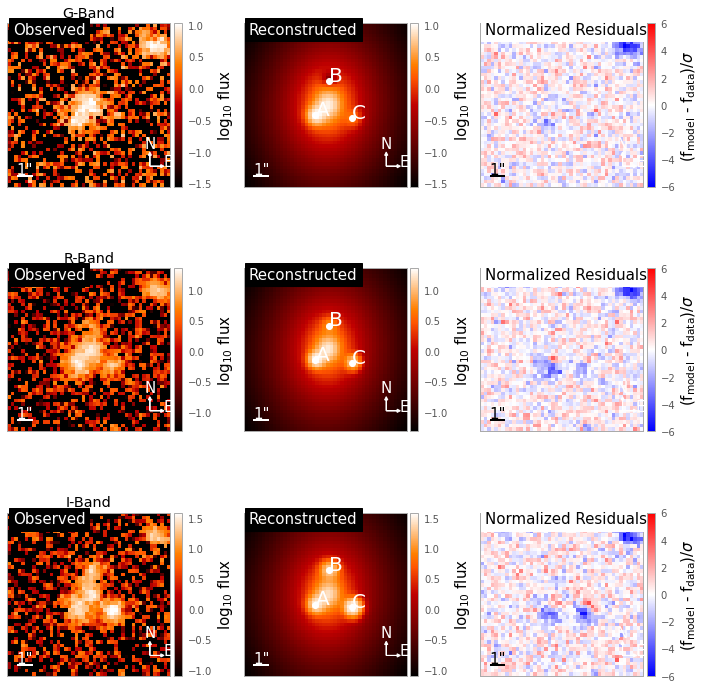

number of non-linear parameters in the MCMC process:  17
parameters in order:  ['theta_E_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'R_sersic_lens_light0', 'n_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'ra_image', 'ra_image', 'ra_image', 'dec_image', 'dec_image', 'dec_image']
number of evaluations in the MCMC process:  102000
102000
Measured Positions: 
center: (0.251, 0.104)
ra_images: [-0.618, 0.374, 1.88] 
dec_images: [-0.863, 1.795, -1.083]
Result Positions: 
center: (0.35, 0.0)
ra_images: [-0.72  0.27  1.98]
dec_images: [-0.76  1.79 -0.98]
Total Memory Usage: 748.7734375


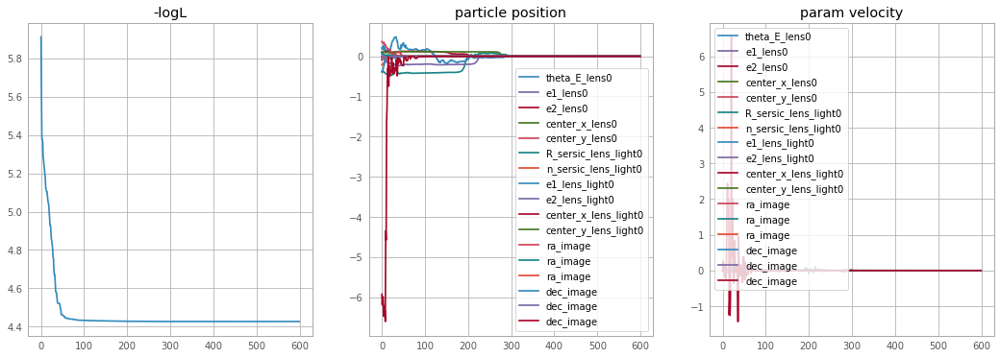

<Figure size 432x288 with 0 Axes>

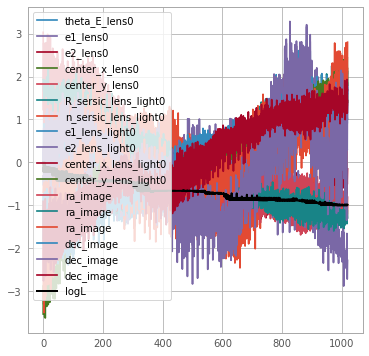

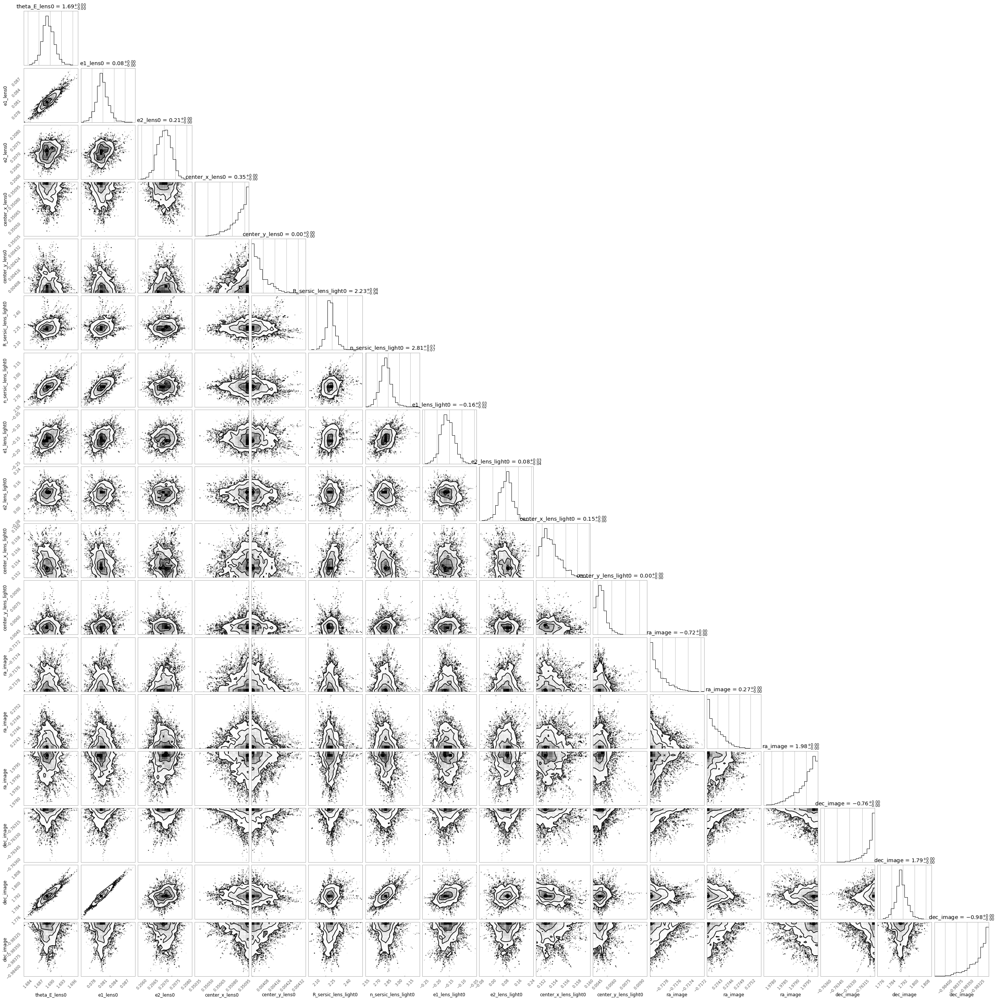

In [12]:
# DES_2915, coadd_id = 1400263522

# background_rms
crop = [[85, 114], [85, 114]]
rms_list = get_rms_fast(rms_filename, 1400263522, crop)

# image positions, measured
x_images = [-0.618, 0.374, 1.88]
y_images = [-0.863, 1.795, -1.083]

# lens position
center_x = 0.251
center_y = 0.104

# initial guesses for params
theta_E = approx_theta_E(center_x, center_y, x_images, y_images)
kwargs_lens_initial = {'theta_E': theta_E, 'e1': 0., 'e2': 0.,
                       'center_x': center_x, 'center_y': center_y}
kwargs_light_initial = {'R_sersic': 1, 'n_sersic': 2, 'e1': 0., 'e2': 0.,
                        'center_x': center_x, 'center_y': center_y}

# run model with memory tracker
mem_usage = memory_usage((model, (1400263522,
                                  kwargs_lens_initial,
                                  kwargs_light_initial,
                                  x_images, y_images,
                                  psf_type, rms_list), ))

print(f"Total Memory Usage: {mem_usage[-1]}")
print("================================================================")

### Summary: 
* GAUSSIAN psf model
* lens mass and light position vary within +-0.1 arcsec
* image positions vary within +- 0.1 arcsec
* PSO did not converge
    * 600 particles, 600 iterations
    * time taken = 16 min
* MCMC: 
    * 200 burn, 600 run, 10 walkerRatio
    * time taken = 7 min
    * num of free params: 17
* total memory: 750
* total time: 23 min

'Estimated theta_E': 2.06
Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
Max iteration reached! Stopping.
-9.924709055463103 reduced X^2 of best position
-31357.11826073567 logL
6319.0 effective number of data points
[{'theta_E': 2.1352018050759467, 'e1': -0.03902759805757813, 'e2': 0.042824391767872255, 'center_x': 1.5801441173778636, 'center_y': -1.232019864496252}] lens result
[] source result
[{'amp': 1, 'R_sersic': 2.2067717111195893, 'n_sersic': 4.999999625204447, 'e1': 0.11394053573969723, 'e2': -0.1635844282307336, 'center_x': 1.5800000198705344, 'center_y': -1.430999788713678}] lens light result
[{'ra_image': array([-3.19998650e-02, -9.99683450e-04,  3.71371492e+00]), 'dec_image': array([ 0.10100002, -2.54199974, -1.9771412 ]), 'point_amp': array([1., 1., 1.])}] point source

100%|█████████████████████████████████████████| 800/800 [07:02<00:00,  1.89it/s]

Computing the MCMC...
Number of walkers =  170
Burn-in iterations:  200
Sampling iterations (in current run): 800
423.02232813835144 time taken for MCMC sampling
-9.881211952389354 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  1.6910983313445171
reduced chi^2 of data  1 =  8.625471184540709
reduced chi^2 of data  2 =  19.327066341282837


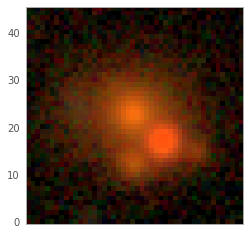

/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',


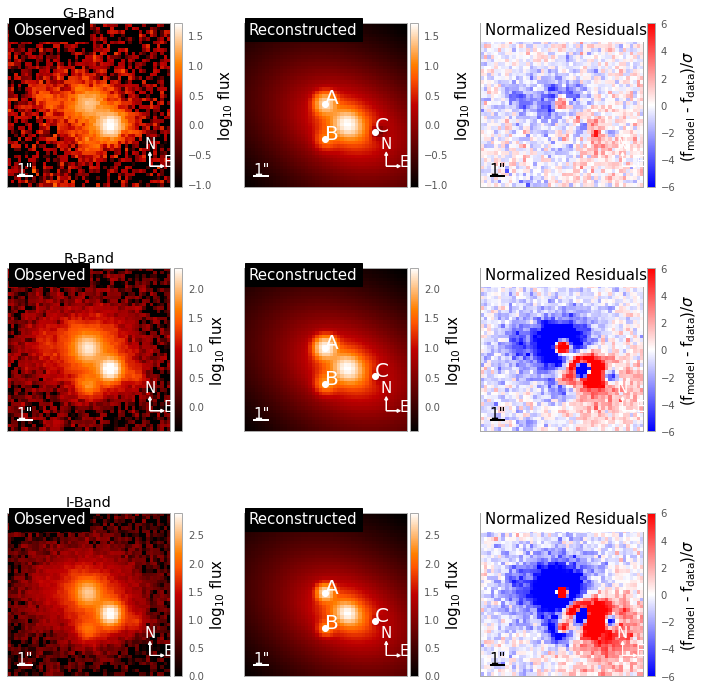

number of non-linear parameters in the MCMC process:  17
parameters in order:  ['theta_E_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'R_sersic_lens_light0', 'n_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'ra_image', 'ra_image', 'ra_image', 'dec_image', 'dec_image', 'dec_image']
number of evaluations in the MCMC process:  102000
102000
Measured Positions: 
center: (1.68, -1.331)
ra_images: [0.068, 0.099, 3.623] 
dec_images: [0.201, -2.442, -1.878]
Result Positions: 
center: (1.58, -1.23)
ra_images: [-0.03 -0.    3.71]
dec_images: [ 0.1  -2.54 -1.98]
Total Memory Usage: 720.015625


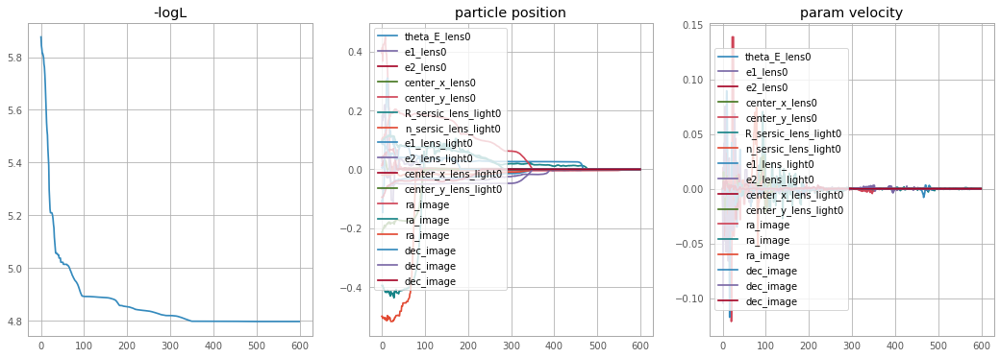

<Figure size 432x288 with 0 Axes>

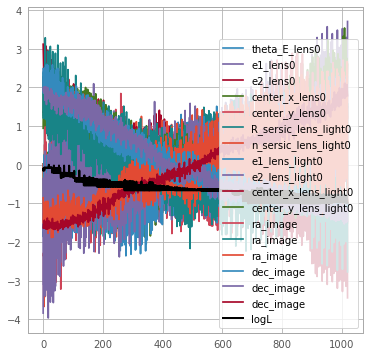

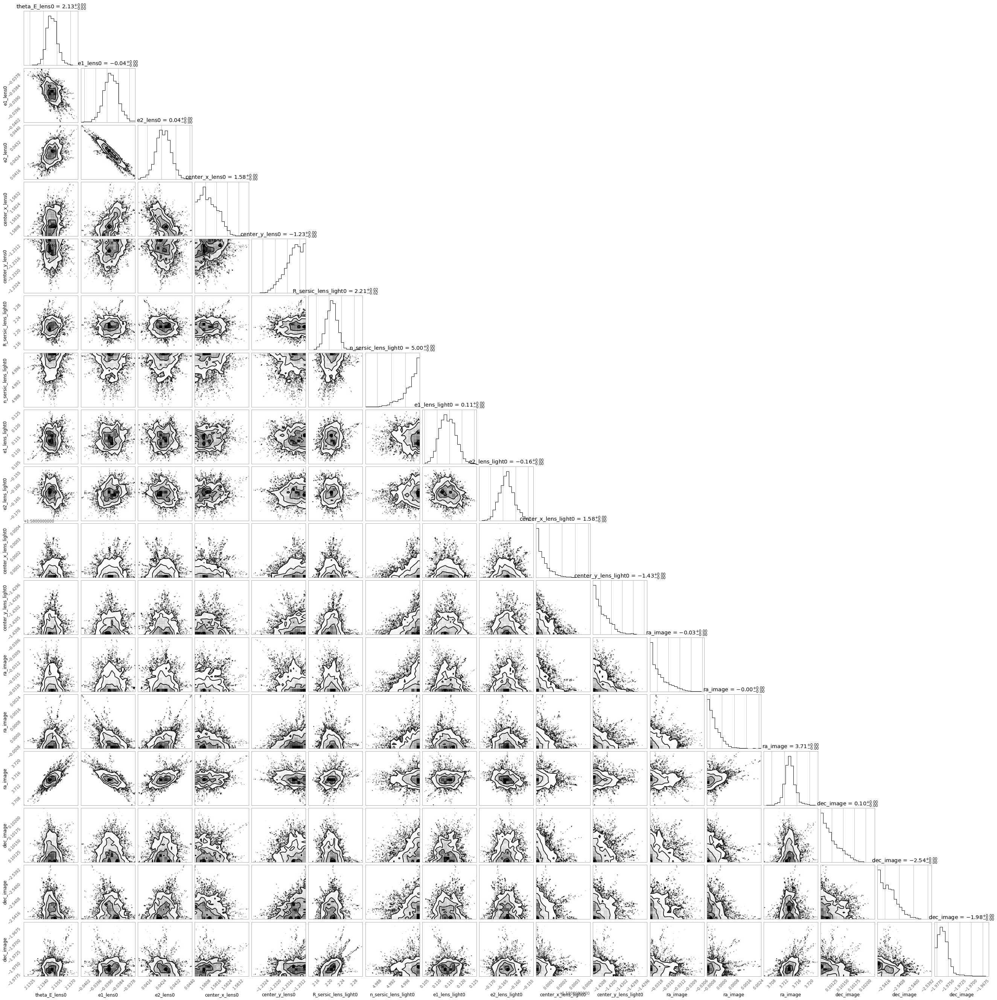

In [13]:
# DES_4414, coadd_id = 1087262176

# background_rms
crop = [[0, 35], [0, 35]]
rms_list = get_rms_fast(rms_filename, 1087262176, crop)

# lens position:
center_x = 1.68
center_y = -1.331

# image positions, measured
x_images = [0.068, 0.099, 3.623]
y_images = [0.201, -2.442, -1.878]

# initial guesses for params
theta_E = approx_theta_E(center_x, center_y, x_images, y_images)

kwargs_lens_initial = {'theta_E': theta_E, 'e1': 0., 'e2': 0,
                       'center_x': center_x, 'center_y': center_y}
kwargs_light_initial = {'R_sersic': 1, 'n_sersic': 2, 'e1': 0,
                        'e2': 0, 'center_x': center_x, 'center_y': center_y}

# run model with memory tracker
mem_usage = memory_usage((model, (1087262176,
                                  kwargs_lens_initial,
                                  kwargs_light_initial,
                                  x_images, y_images,
                                  psf_type, rms_list), ))

print(f"Total Memory Usage: {mem_usage[-1]}")
print("================================================================")


### Summary: 
* GAUSSIAN psf model
* lens mass and light position vary within +-0.1 arcsec
* image positions vary for image positions is +- 0.1 arcsec
* PSO did not converge
    * 600 particles, 600 iterations
    * time taken = 11 min
* MCMC: 
    * 200 burn, 600 run, 10 walkerRatio
    * time taken = 7.5 min
    * num of free params: 17
* total memory: 790
* total time: 18.5 min